In [1]:
import sys
import os
import torch
project_root = os.path.abspath(os.path.join(os.getcwd(), '..'))
if project_root not in sys.path:
    print(f"Adding {project_root} to sys.path")
    sys.path.insert(0, project_root)

Adding /home/hoangtungvum/CODE/Explain_Image_Captioning to sys.path


2025-04-16 11:01:03.681419: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-16 11:01:03.691662: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744776063.703798   34026 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744776063.707347   34026 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1744776063.717095   34026 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

{'data': {'data_root': 'data/flickr8k/Images', 'caption_file': 'data/flickr8k/captions.txt', 'vocab_threshold': 3, 'validation_split': 0.15, 'num_workers': 4}, 'model': {'type': 'cetd', 'image_size': 224, 'hidden_size': 512, 'num_decoder_layers': 2, 'num_decoder_heads': 8}, 'training': {'batch_size': 64, 'num_epochs': 50, 'learning_rate': 0.0003, 'save_freq': 2, 'checkpoint_path': 'checkpoints_cetd/', 'resume': None, 'mixed_precision': True, 'early_stopping': 5}}
../checkpoints_cetd/best_model.pth


/home/hoangtungvum/CODE/Explain_Image_Captioning/utils/load.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device

Dummy image shape: torch.Size([1, 3, 224, 224])
Model loaded from ../checkpoints_cetd/best_model.pth
Model was trained for 22 epochs


Processing Images:   0%|          | 0/10 [00:00<?, ?it/s]

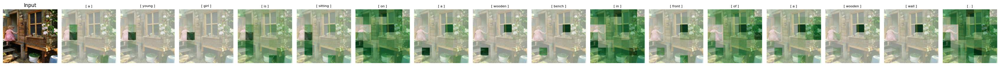

Processing Images:  10%|█         | 1/10 [00:00<00:08,  1.02it/s]

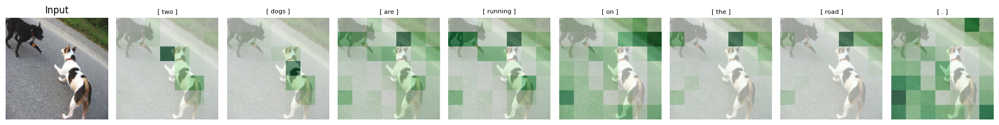

Processing Images:  20%|██        | 2/10 [00:01<00:05,  1.60it/s]

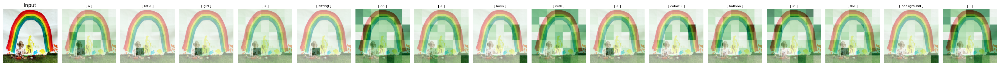

Processing Images:  30%|███       | 3/10 [00:02<00:04,  1.48it/s]

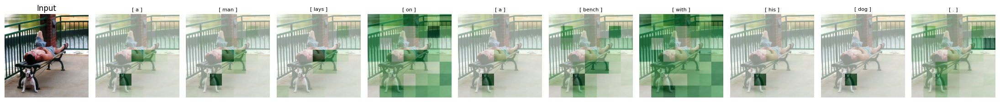

Processing Images:  40%|████      | 4/10 [00:02<00:03,  1.71it/s]

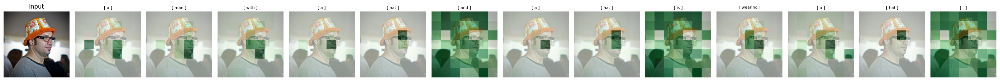

Processing Images:  50%|█████     | 5/10 [00:03<00:02,  1.73it/s]

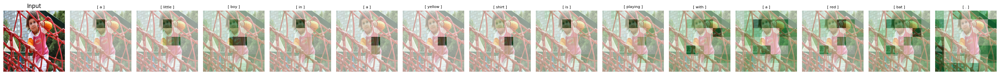

Processing Images:  60%|██████    | 6/10 [00:03<00:02,  1.50it/s]

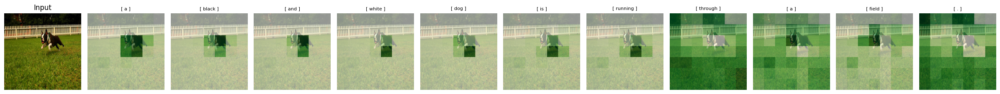

Processing Images:  70%|███████   | 7/10 [00:04<00:01,  1.62it/s]

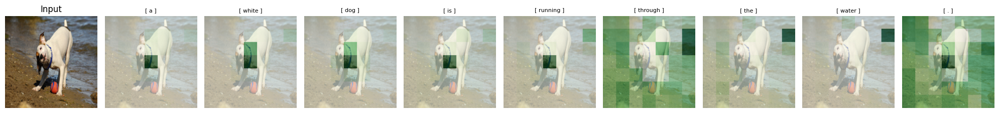

Processing Images:  80%|████████  | 8/10 [00:04<00:01,  1.78it/s]

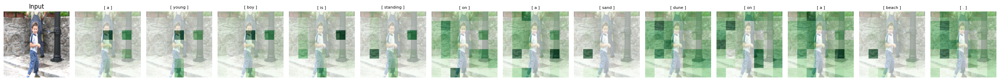

Processing Images:  90%|█████████ | 9/10 [00:05<00:00,  1.75it/s]

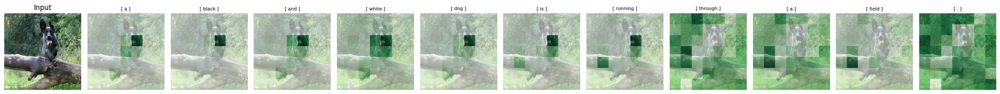

Processing Images: 100%|██████████| 10/10 [00:05<00:00,  1.67it/s]


In [2]:
from glob import glob
from tqdm import tqdm
from utils.load import load_config, load_model
from utils.explain import explain_inference_image, visualize_attention, explain_inference_img_conv


# Paths and config
img_dir = "../data/flickr8k/Images"
config_path = "../config/train_config3.json"
checkpoint_path = "../checkpoints_cetd/best_model.pth"

# Load model and vocab
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
config = load_config(config_path)
print(config)
print(checkpoint_path)
model, vocab = load_model(config, checkpoint_path, device)

# Get 30 image paths
image_paths = sorted(glob(os.path.join(img_dir, "*.jpg")))[:10]

# Process each image
for img_path in tqdm(image_paths, desc="Processing Images"):
    try:
        image_tensor, caption, attention_maps = explain_inference_img_conv(img_path, model, vocab)
        attention_maps_np = [attn for attn in attention_maps]
        
        # Generate a filename-safe output name
        filename = os.path.splitext(os.path.basename(img_path))[0]
        
        # Visualize and save
        visualize_attention(image_tensor, caption, attention_maps_np)
    except Exception as e:
        print(f"Failed to process {img_path}: {e}")


/home/hoangtungvum/CODE/Explain_Image_Captioning/utils/load.py:49: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device

Model loaded from ../checkpoints_ictransformer2/best_model.pth
Model was trained for 26 epochs


Processing Images:   0%|          | 0/10 [00:00<?, ?it/s]

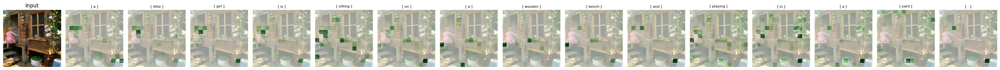

Processing Images:  10%|█         | 1/10 [00:00<00:05,  1.76it/s]

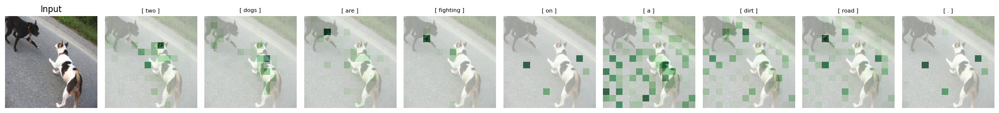

Processing Images:  20%|██        | 2/10 [00:00<00:03,  2.22it/s]

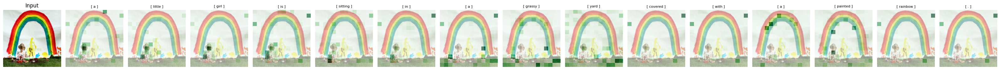

Processing Images:  30%|███       | 3/10 [00:01<00:04,  1.55it/s]

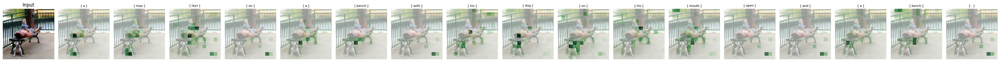

Processing Images:  40%|████      | 4/10 [00:02<00:03,  1.60it/s]

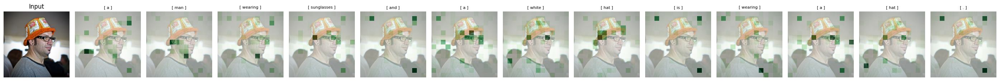

Processing Images:  50%|█████     | 5/10 [00:02<00:02,  1.76it/s]

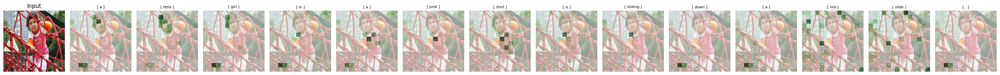

Processing Images:  60%|██████    | 6/10 [00:03<00:02,  1.81it/s]

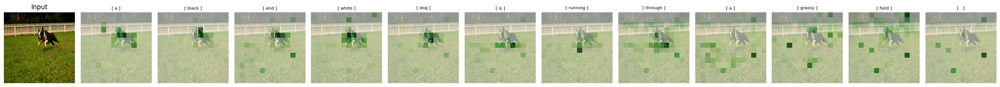

Processing Images:  70%|███████   | 7/10 [00:03<00:01,  1.86it/s]

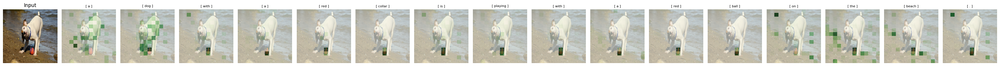

Processing Images:  80%|████████  | 8/10 [00:04<00:01,  1.78it/s]

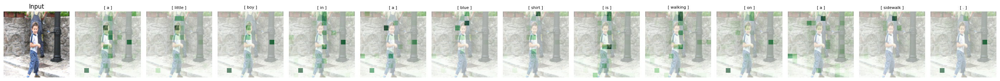

Processing Images:  90%|█████████ | 9/10 [00:05<00:00,  1.85it/s]

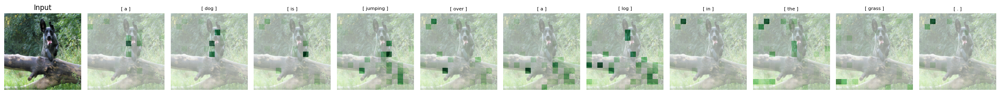

Processing Images: 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]


In [3]:
import sys
import os
import torch
from glob import glob
from tqdm import tqdm
from models.ICtransformer import ICTransformer
from utils.load import load_config, load_model
from utils.explain import explain_inference_image, visualize_attention

# Paths and 
img_dir = "/home/hoangtungvum/CODE/Explain_Image_Captioning/data/flickr8k/Images"
config_path = "../config/train_config2.json"
checkpoint_path = "../checkpoints_ictransformer2/best_model.pth"

# Load model and vocab
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
config = load_config(config_path)
model, vocab = load_model(config, checkpoint_path, device)

# Get 30 image paths
image_paths = sorted(glob(os.path.join(img_dir, "*.jpg")))[:10]

# Process each image
for img_path in tqdm(image_paths, desc="Processing Images"):
    try:
        image_tensor, caption, attention_maps = explain_inference_image(img_path, model, vocab)
        attention_maps_np = [attn for attn in attention_maps]
        
        # Generate a filename-safe output name
        filename = os.path.splitext(os.path.basename(img_path))[0]
        
        # Visualize and save
        visualize_attention(image_tensor, caption, attention_maps_np)
    except Exception as e:
        print(f"Failed to process {img_path}: {e}")